# 1.3 The Double Pendulum

<!-- This single H1 (one per notebook, "# <number> <Title>") is the page's
     title: it sets the sidebar entry, breadcrumb, browser tab, and search
     result. The branded banner below is generated by the shared `ecp`
     package, so the look of every notebook in the series lives in one place. -->

In [1]:
from ecp.style import header, use_style

use_style()  # apply the series Matplotlib style
header(
    volume="Volume I — Elementary Mechanics",
    number="1.3",
    title="The Double Pendulum",
    blurb="From a two-line Lagrangian to deterministic chaos: equations of "
    "motion, energy conservation, the phase portrait, sensitive dependence, "
    "and a kernel-free animation.",
    difficulty="intermediate",
    estimate="60–90 min",
)

<ECP header: 2506 chars of HTML>

## Notebook overview

The double pendulum (a pendulum hung from the end of another pendulum) is
the smallest mechanical system most students meet that is genuinely
*chaotic*. It is fully deterministic: given the initial angles and angular
velocities, Newton (or, more comfortably, Lagrange) fixes the entire future.
Yet two starts that differ by a hair diverge exponentially, so in practice
the motion is unpredictable. That tension (determinism without
predictability) is the whole pedagogical point, and it is best *seen* rather
than described, which is exactly what a notebook is good for.

We will (1) set up coordinates and the Lagrangian, (2) obtain the equations
of motion (once by hand, once symbolically with SymPy as a check), (3)
integrate them numerically, (4) verify the solution by watching the total
energy stay constant, (5) draw the phase portrait, (6) measure sensitive
dependence on initial conditions, and (7) animate the motion.

> **Scope.** This is a working review, not a textbook chapter. For the
> analytical mechanics behind it, see Nolting, *Theoretische Physik 1–2*
> (Klassische Mechanik) {cite}`nolting1,nolting2`; Goldstein, Poole & Safko,
> *Classical Mechanics* {cite}`goldstein`; and, for the geometry of chaos,
> Strogatz, *Nonlinear Dynamics and Chaos* {cite}`strogatz`.

## Theory in brief

### Coordinates and the Lagrangian

Take two point masses $m_1, m_2$ on massless rigid rods of lengths
$\ell_1, \ell_2$. Measure both angles $\theta_1, \theta_2$ from the downward
vertical. The bob positions are

$$
x_1 = \ell_1 \sin\theta_1, \quad y_1 = -\ell_1 \cos\theta_1, \qquad
x_2 = x_1 + \ell_2 \sin\theta_2, \quad y_2 = y_1 - \ell_2 \cos\theta_2 .
$$

Differentiating gives the kinetic energy $T = \tfrac12 m_1(\dot x_1^2 + \dot
y_1^2) + \tfrac12 m_2(\dot x_2^2 + \dot y_2^2)$ and the potential energy
$V = m_1 g y_1 + m_2 g y_2$. The Lagrangian is $\mathcal{L} = T - V$:

$$
\mathcal{L} = \tfrac12 (m_1+m_2)\ell_1^2\dot\theta_1^2
  + \tfrac12 m_2 \ell_2^2 \dot\theta_2^2
  + m_2 \ell_1 \ell_2 \dot\theta_1 \dot\theta_2 \cos(\theta_1-\theta_2)
  + (m_1+m_2) g \ell_1 \cos\theta_1 + m_2 g \ell_2 \cos\theta_2 .
$$

### Equations of motion

The Euler–Lagrange equations $\frac{d}{dt}\frac{\partial \mathcal L}{\partial
\dot\theta_i} - \frac{\partial \mathcal L}{\partial \theta_i} = 0$ yield two
coupled second-order ODEs. Solved for the angular accelerations (writing
$\Delta = \theta_1-\theta_2$ and $D = 2m_1 + m_2 - m_2\cos 2\Delta$):

$$
\ddot\theta_1 = \frac{-g(2m_1+m_2)\sin\theta_1 - m_2 g \sin(\theta_1-2\theta_2)
  - 2\sin\Delta\, m_2(\dot\theta_2^2 \ell_2 + \dot\theta_1^2 \ell_1\cos\Delta)}
  {\ell_1 D},
$$

$$
\ddot\theta_2 = \frac{2\sin\Delta\,\big(\dot\theta_1^2 \ell_1 (m_1+m_2)
  + g(m_1+m_2)\cos\theta_1 + \dot\theta_2^2 \ell_2 m_2 \cos\Delta\big)}
  {\ell_2 D}.
$$

We will reproduce these symbolically below rather than trust the algebra.

### Small oscillations

For $|\theta_i| \ll 1$ the system linearises to two coupled harmonic
oscillators with two **normal modes**. For the equal case
$m_1=m_2=m,\ \ell_1=\ell_2=\ell$ the mode frequencies are

$$
\omega_\pm^2 = (2 \pm \sqrt{2})\,\frac{g}{\ell}.
$$

(Taylor, *Classical Mechanics*, Ch. 11, carries the linearisation out in full
for exactly this system; the general eigenvalue machinery behind it is the
subject of [§2.7](../02-classical-mechanics/small-oscillations.ipynb).)

This is our first independent check: any correct integrator, started at tiny
amplitude, must oscillate at these frequencies.

### The geometry

Two rods hang from a fixed pivot: the first, of length $\ell_1$, carries bob
$m_1$ at angle $\theta_1$ from the downward vertical; the second, length
$\ell_2$, hangs from $m_1$ and carries $m_2$ at its own angle $\theta_2$. Both
angles are measured from vertical, so the configuration is the pair
$(\theta_1, \theta_2)$. The animation later sets these in motion; the still
schematic fixes what the symbols mean.

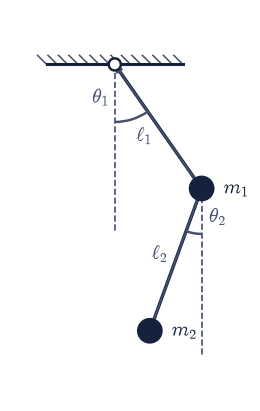

In [2]:
# (solution hidden on the public site)


---
## Setup

Data only: the libraries, and the five numbers that fix the physical system —
gravity $g$, the two bob masses, and the two rod lengths, taken equal unless
an exercise says otherwise. Not one function is defined here. Everything this
notebook is *about* — the equations of motion, the integrator wrapper that
drives them, the energy meter that certifies the integration, the spectrum
that locates the normal modes, the Lyapunov fit, and the animation callback —
you write in the exercise where it belongs.

The Setup below holds this notebook's data and instruments — nothing you
are asked to build. It is collapsed so the building stays yours; expand it
whenever you want the details.

<!-- setup-policy: v2 -->

In [3]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

from ecp import validate
from ecp.animate import show


# data: physical parameters (SI). Equal masses and lengths unless stated
# otherwise.
G = 9.81
M1 = M2 = 1.0
L1 = L2 = 1.0

## Exercise 1 — Implement the equations of motion

Every later exercise rests on the right-hand side of the ODE system, so the
notebook's first build is also its most consequential. The state it advances
is the pair of angles together with their rates,
$\mathbf{y} = (\theta_1, \dot\theta_1, \theta_2, \dot\theta_2)$, and the two
angular accelerations obtained above share the denominator
$D = 2m_1 + m_2 - m_2\cos 2\Delta$, which is worth naming once rather than
writing twice. Hand algebra of that length is exactly where a sign slips,
which is why the check that follows is symbolic rather than numerical: SymPy
differentiates the Lagrangian itself, so an error in the hand derivation
cannot hide in both routes at once.

1. Write `deriv(t, y)`, returning
   $(\dot\theta_1, \ddot\theta_1, \dot\theta_2, \ddot\theta_2)$ from the
   acceleration expressions above. **Write this one yourself** — the
   implementation is the lesson.
2. Cross-check it against an independent SymPy derivation from the Lagrangian
   (the validation below does exactly this at a random state).

In [4]:
# (solution hidden on the public site)


### Validation 1 — symbolic cross-check of the equations of motion

Rather than trust the hand algebra, derive the accelerations from the
Lagrangian with SymPy and confirm they agree with `deriv` at a random state.

In [5]:
import sympy as sp

t = sp.symbols("t")
m1, m2, l1, l2, g = sp.symbols("m1 m2 l1 l2 g", positive=True)
th1 = sp.Function("th1")(t)
th2 = sp.Function("th2")(t)

x1, y1 = l1 * sp.sin(th1), -l1 * sp.cos(th1)
x2, y2 = x1 + l2 * sp.sin(th2), y1 - l2 * sp.cos(th2)
T = sp.Rational(1, 2) * m1 * (sp.diff(x1, t) ** 2 + sp.diff(y1, t) ** 2) + sp.Rational(
    1, 2
) * m2 * (sp.diff(x2, t) ** 2 + sp.diff(y2, t) ** 2)
V = m1 * g * y1 + m2 * g * y2
Lag = sp.simplify(T - V)

# Euler–Lagrange -> solve for the two angular accelerations.
EL = [sp.diff(sp.diff(Lag, sp.diff(q, t)), t) - sp.diff(Lag, q) for q in (th1, th2)]
acc = sp.solve(EL, [sp.diff(th1, t, 2), sp.diff(th2, t, 2)], dict=True)[0]
dd1 = sp.lambdify(
    (th1, sp.diff(th1, t), th2, sp.diff(th2, t), m1, m2, l1, l2, g),
    acc[sp.diff(th1, t, 2)],
)
dd2 = sp.lambdify(
    (th1, sp.diff(th1, t), th2, sp.diff(th2, t), m1, m2, l1, l2, g),
    acc[sp.diff(th2, t, 2)],
)

probe = [0.7, -0.4, 1.9, 0.25]
hand = deriv(0.0, probe)
symb = [
    probe[1],
    dd1(probe[0], probe[1], probe[2], probe[3], M1, M2, L1, L2, G),
    probe[3],
    dd2(probe[0], probe[1], probe[2], probe[3], M1, M2, L1, L2, G),
]
validate.close(hand, symb, "hand-derived EOM match the SymPy derivation", rtol=1e-9)

✓  hand-derived EOM match the SymPy derivation   [max|Δ| = 8.88178e-16 (rtol=1e-09, atol=1e-09)]


True

## Exercise 2 — Integrate and view the motion

Chaotic systems are unforgiving of sloppy integration: a local error a regular
orbit would absorb is amplified exponentially here, so the driver throughout
this notebook is `scipy.integrate.solve_ivp` with `DOP853` (an eighth-order
explicit Runge–Kutta) at `rtol = atol = 1e-10`, sampled onto a dense uniform
output grid. One trap is worth naming before you fall into it: `solve_ivp`
hands extra arguments to the right-hand side *positionally*, so a wrapper that
forwards a parameter dictionary in whatever order it happens to hold would let
a caller who overrides $m_2$ alone have that value bind silently to $m_1$ — a
physics error with no traceback. Match the parameters to `deriv`'s signature
by name.

1. Write `simulate(y0, t_end, n, **params)`, integrating the `deriv` of
   Exercise 1 under the settings above and returning the solution object.
2. Run it over $20$ s from the large-amplitude start
   $(\theta_1, \theta_2) = (120^\circ, -10^\circ)$, released from rest.
3. Plot both angles against time.

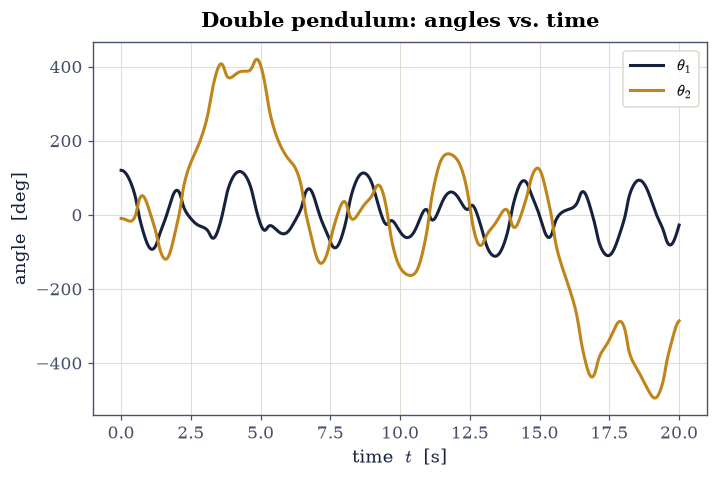

In [6]:
# (solution hidden on the public site)


## Exercise 3 — Total energy as a validation of the integrator

A correct, well-integrated trajectory conserves total mechanical energy — the
canonical "did I integrate it right?" check. Neither `deriv` nor `solve_ivp`
was ever told about energy, so agreement between them is evidence rather than
a tautology: $E = T + V$ is assembled independently from the bob velocities of
the Theory section, and whatever drift it shows is accumulated truncation
error, not physics.

1. Write `total_energy(y)`, returning $T + V$ for a state — or, broadcast over
   the time axis, for a whole state history.
2. Evaluate it along the Exercise 2 trajectory and plot the relative drift
   $(E - E_0)/|E_0|$ against time.
3. Confirm that drift is tiny.

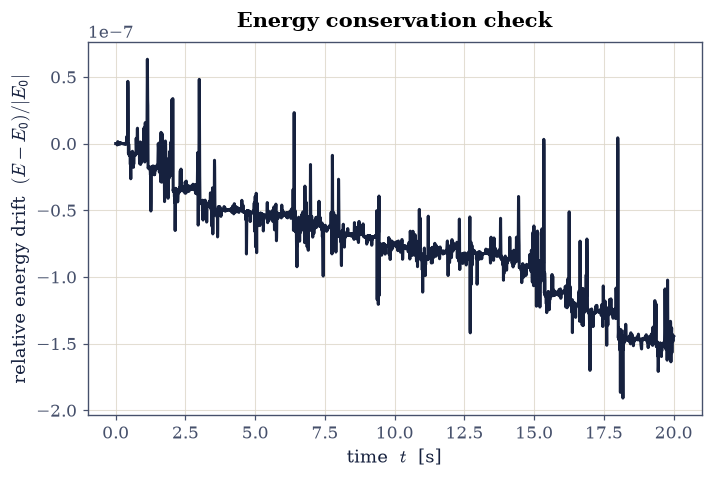

In [7]:
# (solution hidden on the public site)


In [8]:
validate.conserved(E, "total energy conserved along the trajectory", rel_drift=1e-4)

✓  total energy conserved along the trajectory   [max relative drift = 1.90857e-07 (limit 0.0001)]


True

## Exercise 4 — Small-amplitude normal modes

At tiny amplitude the system linearises, and its oscillation must sit at a
normal-mode frequency $\omega_\pm^2 = (2\pm\sqrt2)\,g/\ell$ — a check of the
*physics* against linear theory.

1. With the `simulate` you wrote in Exercise 2, start at small, in-phase
   angles (which excites mainly the low mode) and integrate a long run.
2. Take the power spectrum of $\theta_1(t)$ (`numpy.fft.rfft`/`rfftfreq`) and
   locate the dominant peak.
3. Plot the normalised spectrum with both mode frequencies marked.
4. Confirm the peak matches $\omega_-=\sqrt{(2-\sqrt2)\,g/\ell}$.

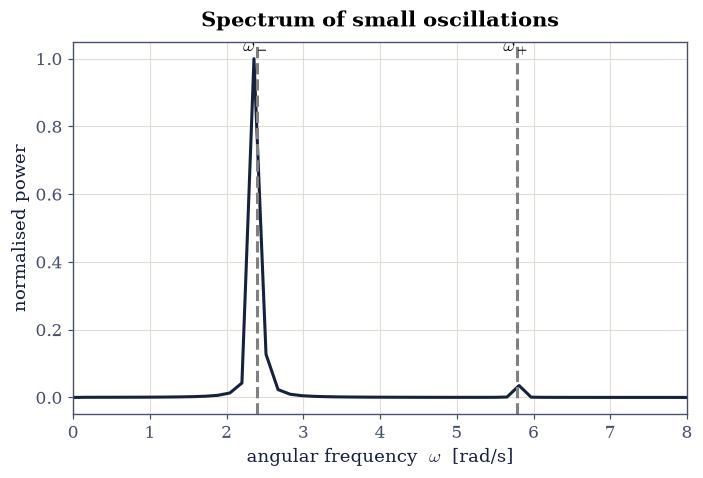

In [9]:
# (solution hidden on the public site)


In [10]:
validate.close(
    omega_measured,
    omega_minus,
    "small-amplitude peak matches the low normal mode",
    rtol=3e-2,
)  # tolerance covers the discrete FFT bin width

✓  small-amplitude peak matches the low normal mode   [got 2.3559 vs expected 2.3972 (rtol=0.03, atol=1e-09)]


True

## Exercise 5 — Phase portrait

A single pendulum's phase portrait is a family of closed loops: one degree of
freedom, and energy conservation alone already confines the motion to a curve.
The double pendulum has two degrees of freedom and still only energy to
constrain them, so its trajectory is free to wander a band rather than close —
the visual signature of non-integrable motion, and the contrast against every
integrable portrait of this volume.

1. With the `simulate` you wrote in Exercise 2, integrate a long,
   large-amplitude run ($120$ s at $200$ samples per second).
2. Plot the trajectory in the $(\theta_2, \dot\theta_2)$ plane, using a thin,
   semi-transparent line so that the density shows.

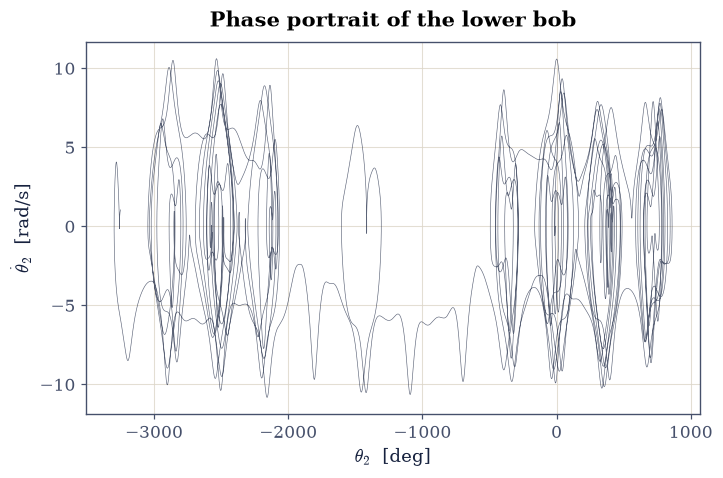

In [11]:
# (solution hidden on the public site)


## Exercise 6 — Sensitive dependence on initial conditions

Determinism and predictability are not the same thing, and this is where they
part company. Two trajectories that start a hair apart separate as
$\delta(t)\sim\delta_0 e^{\lambda t}$ while the separation is still small; the
growth rate $\lambda$ is the largest Lyapunov exponent, and a positive
$\lambda$ is the formal definition of chaos. The exponential law holds only in
a window: once $\delta$ grows to the size of the system itself the two motions
are simply unrelated and the curve flattens, so the fit has to be restricted
to the growth regime.

1. With the `simulate` you wrote in Exercise 2, run two trajectories whose
   initial angles differ by $\delta_0 = 10^{-6}$ rad and track their
   separation $\delta(t)$ in configuration space.
2. Estimate $\lambda$ from the slope of $\ln\delta$ over the growth window
   (`numpy.polyfit`, before saturation).
3. Plot $\delta(t)$ on a logarithmic axis together with the fitted
   exponential.
4. Confirm $\lambda$ is **positive**.

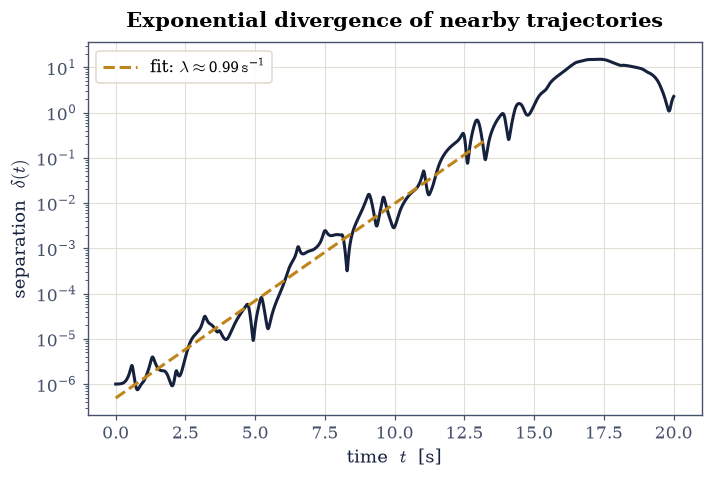

In [12]:
# (solution hidden on the public site)


In [13]:
validate.positive(slope, "largest Lyapunov exponent is positive (chaotic)")

✓  largest Lyapunov exponent is positive (chaotic)   [value = 0.990143]


True

## Exercise 7 — Animate the motion

Everything above describes the motion; here you watch it. The rendering path
matters as much as the physics: `ecp.animate.show` pre-renders the frames into
a self-contained HTML5 player, so the animation plays on the static course
website with no Python kernel behind it.

1. With the `simulate` you wrote in Exercise 2, integrate a short run ($12$ s,
   $300$ frames) and convert the two angles into bob positions.
2. Build a `FuncAnimation` of the two rods and the lower-bob trail.
3. Render it with `ecp.animate.show`.

In [14]:
# (solution hidden on the public site)


## Notebook summary

- The double pendulum's equations of motion (matched against a SymPy derivation) integrated
  with total energy conserved as the integrator check; the small-amplitude normal modes and
  the phase portrait.
- Sensitive dependence on initial conditions (a positive largest Lyapunov exponent), the
  signature of deterministic chaos, with the motion animated.

## Outlook

- Replace the point bobs with physical rods (moments of inertia) and rederive
  the Lagrangian. How do the normal-mode frequencies change?
- Build a **Poincaré section**: record $(\theta_2,\dot\theta_2)$ each time
  $\theta_1=0$ with $\dot\theta_1>0$, and watch regular islands dissolve into
  a chaotic sea as the energy increases.
- Estimate the Lyapunov exponent properly with the Benettin renormalisation
  algorithm instead of a single-shot separation fit.

### References

```{bibliography}
:filter: docname in docnames
```

In [15]:
from ecp.style import footer

footer()

<ECP header: 1221 chars of HTML>